In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import librosa
import IPython
import sklearn.preprocessing

Category: D:/UM/Project/Mozartify/model/dataset/dataset 2/trimmed_audio/happy


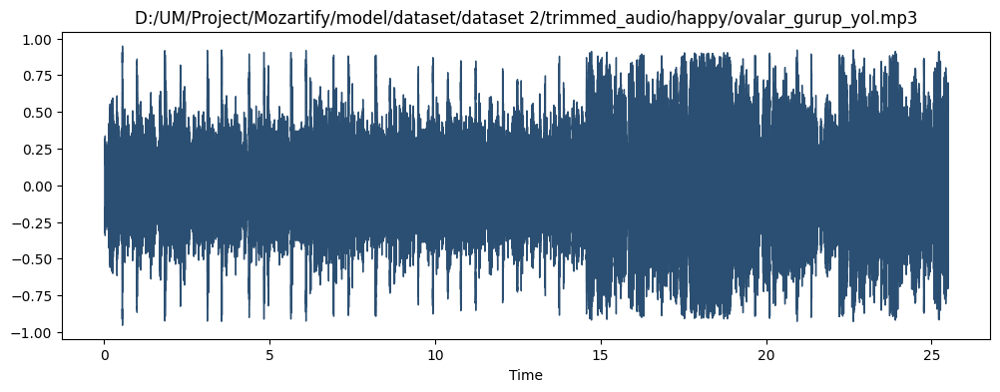

Category: D:/UM/Project/Mozartify/model/dataset/dataset 2/trimmed_audio/sad


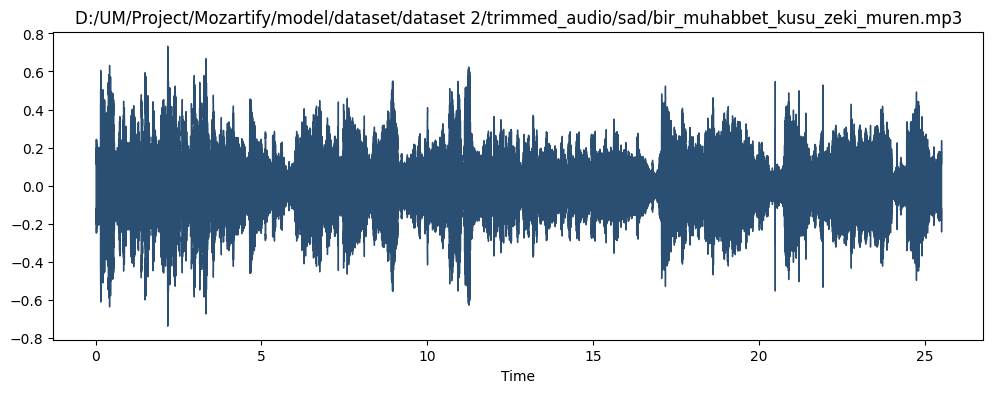

Category: D:/UM/Project/Mozartify/model/dataset/dataset 2/trimmed_audio/angry


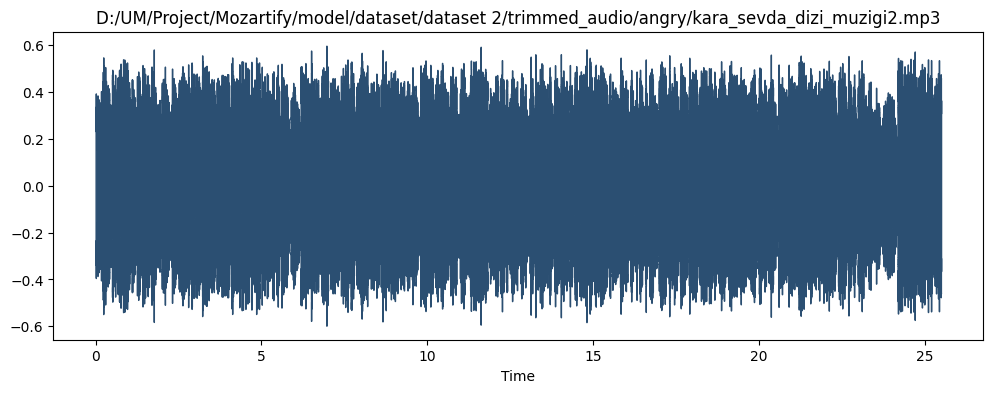

Category: D:/UM/Project/Mozartify/model/dataset/dataset 2/trimmed_audio/relax


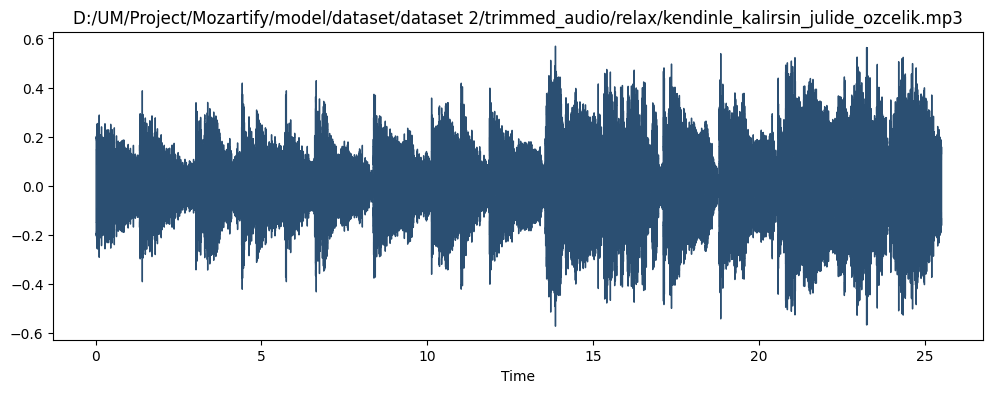

In [2]:
#load sample
file = ['D:/UM/Project/Mozartify/model/dataset/dataset 2/trimmed_audio/happy/ovalar_gurup_yol.mp3',
        'D:/UM/Project/Mozartify/model/dataset/dataset 2/trimmed_audio/sad/bir_muhabbet_kusu_zeki_muren.mp3', 
        'D:/UM/Project/Mozartify/model/dataset/dataset 2/trimmed_audio/angry/kara_sevda_dizi_muzigi2.mp3', 
        'D:/UM/Project/Mozartify/model/dataset/dataset 2/trimmed_audio/relax/kendinle_kalirsin_julide_ozcelik.mp3']
for i in file:
    category = os.path.dirname(i)
    print("Category:",category)
    audio,sr = librosa.load(i)
    IPython.display.display(IPython.display.Audio(i,rate=sr))
    plt.figure(figsize=(12,4))
    librosa.display.waveshow(audio, color ="#2B4F72")
    plt.title(i)
    plt.show()

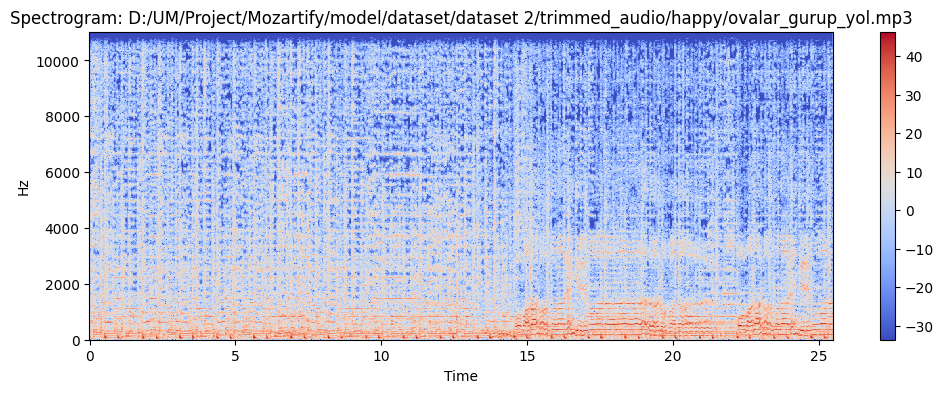

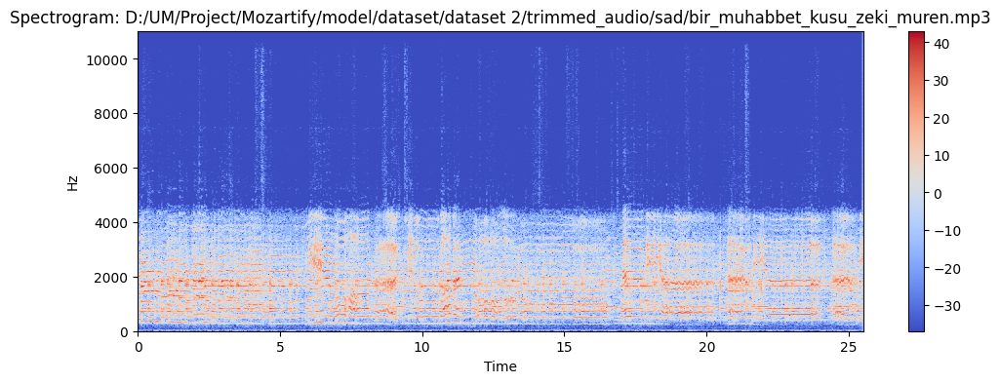

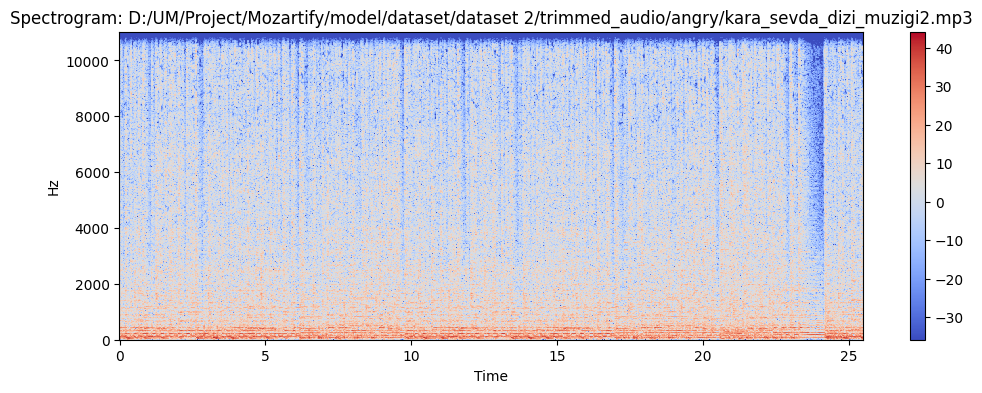

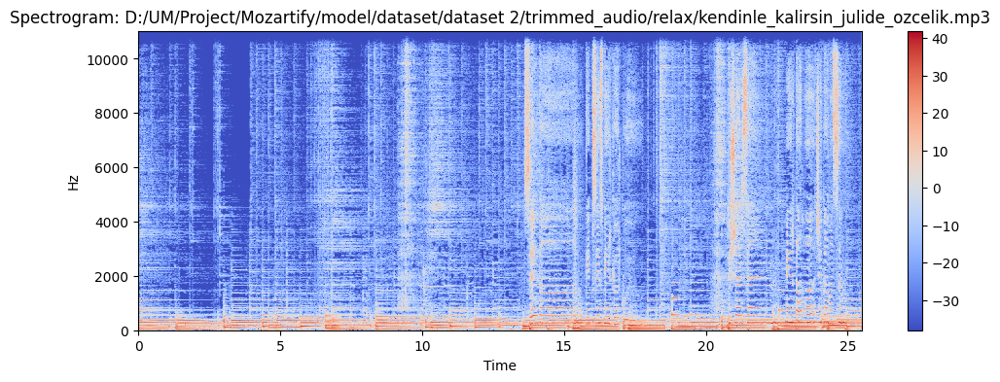

In [3]:
#Spectrograms
for i in file:
    y,sr = librosa.load(i)
    stft = librosa.stft(y)
    stft_db=librosa.amplitude_to_db(abs(stft))
    plt.figure(figsize=(12,4))
    librosa.display.specshow(stft_db,sr=sr,x_axis='time',y_axis='hz')
    plt.colorbar()
    plt.title('Spectrogram: '+ i)

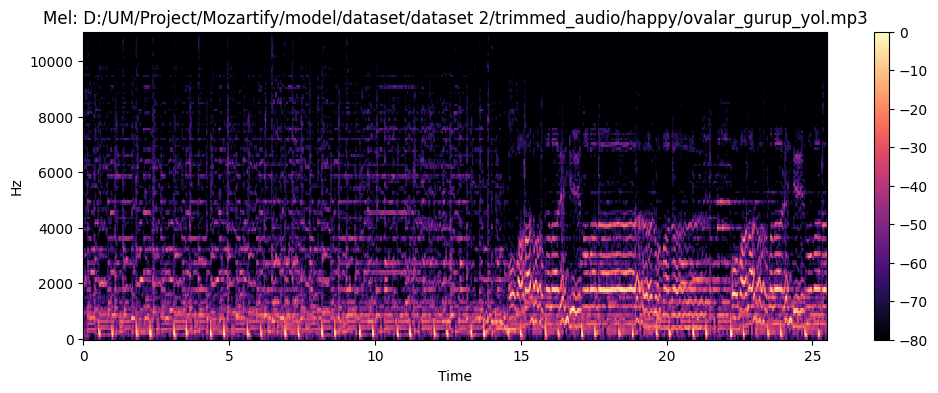

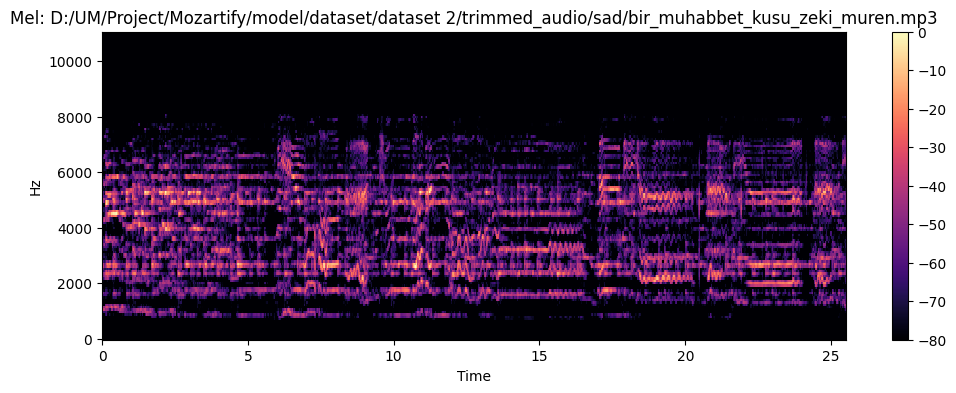

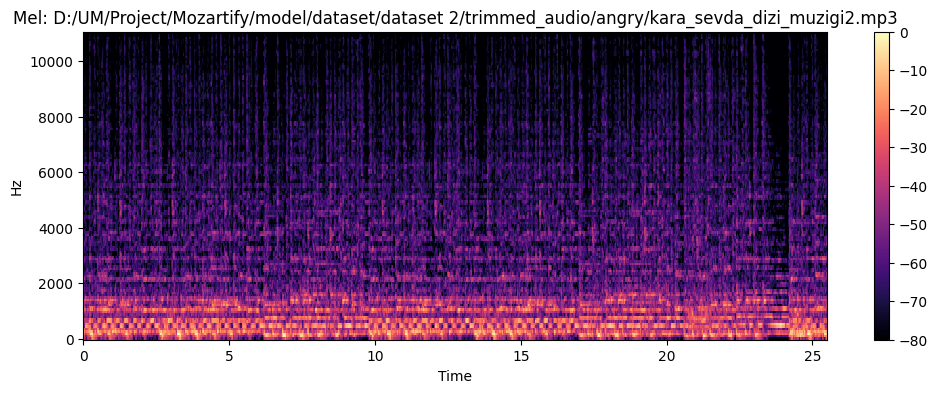

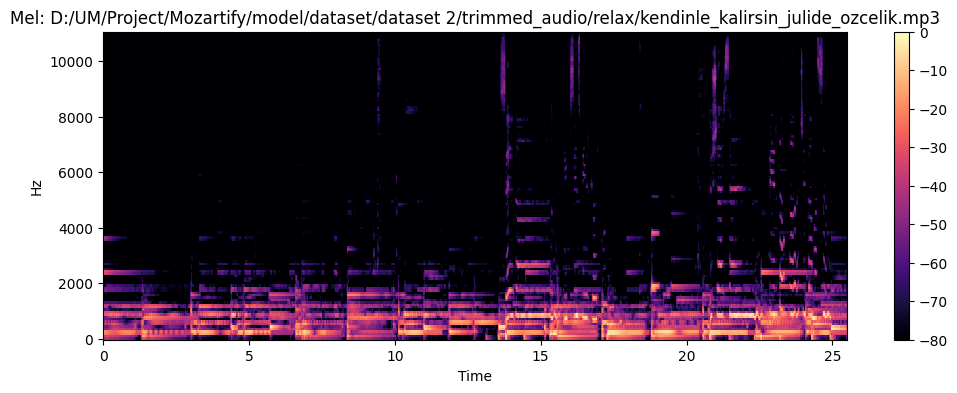

In [4]:
#Mel
for i in file:
    y,sr = librosa.load(i)
    s = librosa.feature.melspectrogram(y=y, sr=sr)
    mel = librosa.amplitude_to_db(s, ref=np.max)
    plt.figure(figsize=(12,4))
    librosa.display.specshow(mel,sr=sr,x_axis='time',y_axis='hz')
    plt.colorbar()
    plt.title('Mel: '+ i)
    plt.show()

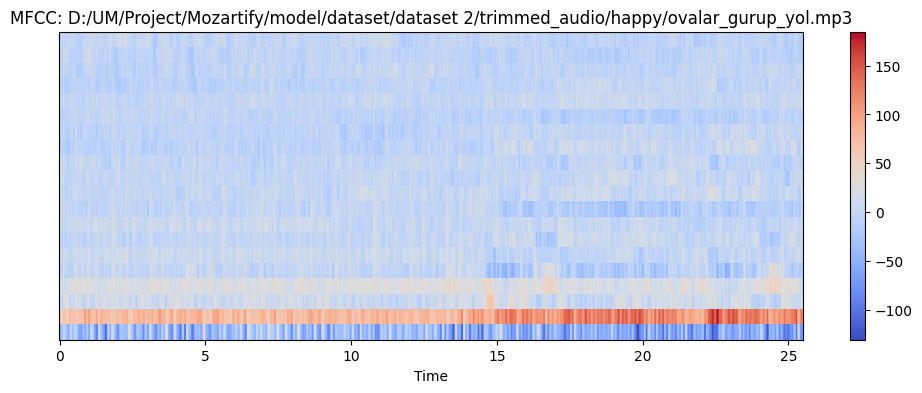

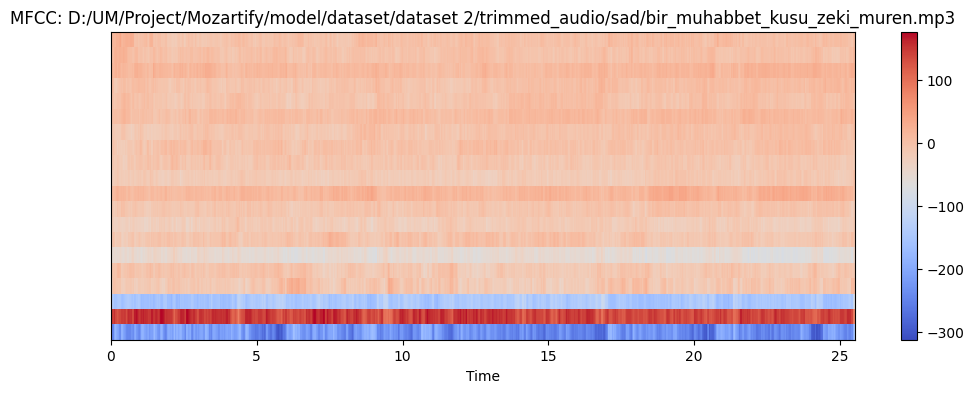

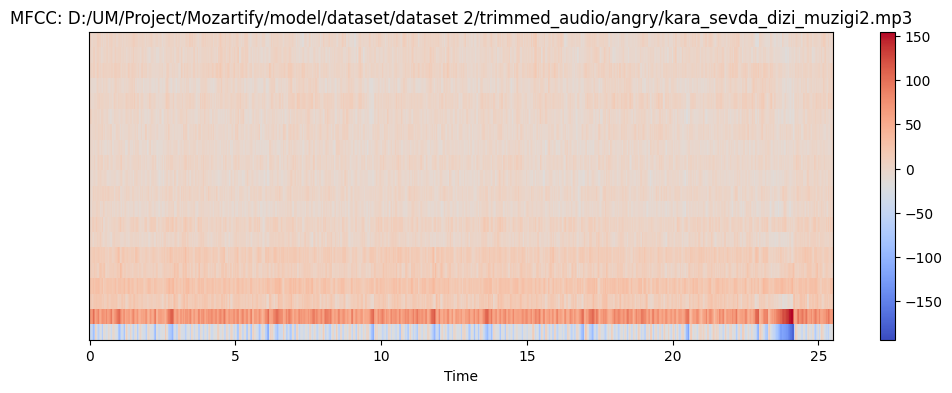

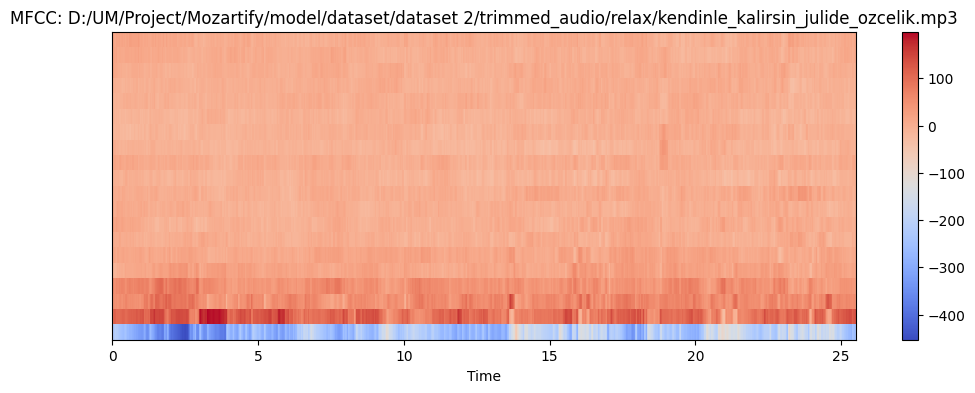

In [5]:
#MFCC
for i in file:
    y,sr = librosa.load(i)
    mfcc=librosa.feature.mfcc(y=y, sr=sr, n_mfcc=20)
    plt.figure(figsize=(12,4))
    librosa.display.specshow(mfcc, sr=sr, x_axis='time')
    plt.colorbar()
    plt.title('MFCC: '+ i)
    plt.show()

In [6]:
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)

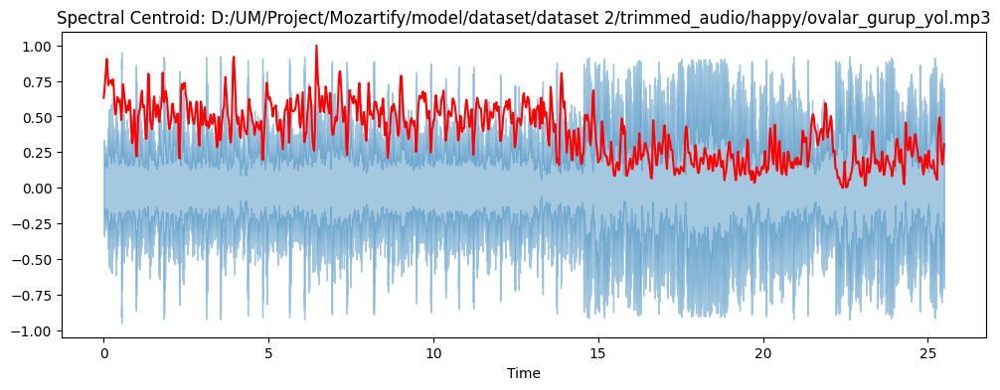

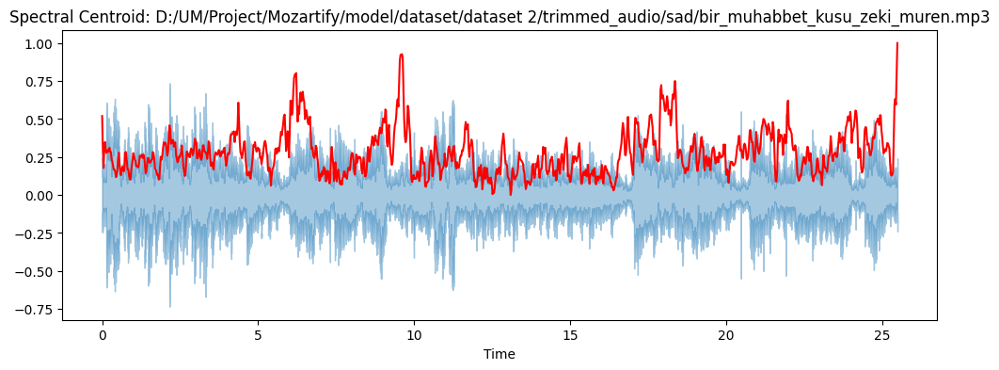

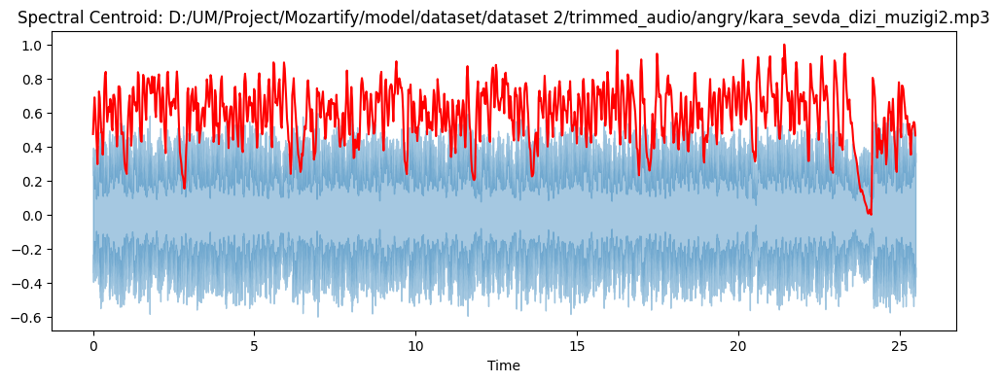

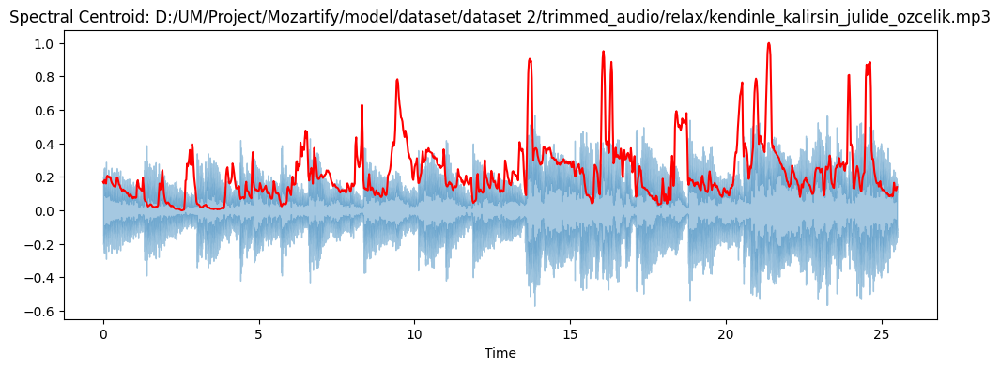

In [7]:
for i in file:
    x,sr = librosa.load(i)
    cent = librosa.feature.spectral_centroid(y=x, sr=sr)[0]
    frames = range(len(cent))
    t = librosa.frames_to_time(frames)

    plt.figure(figsize=(12,4))
    librosa.display.waveshow(x, sr=sr, alpha=0.4)
    
    plt.title('Spectral Centroid: '+ i)
    plt.plot(t, normalize(cent), color='r')

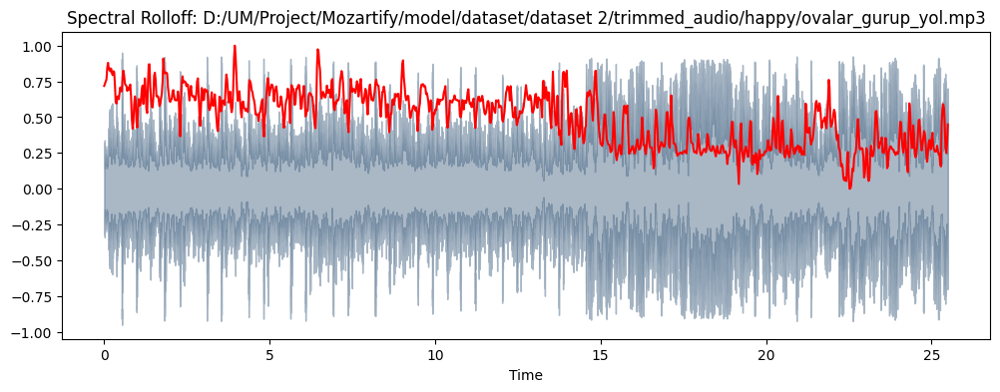

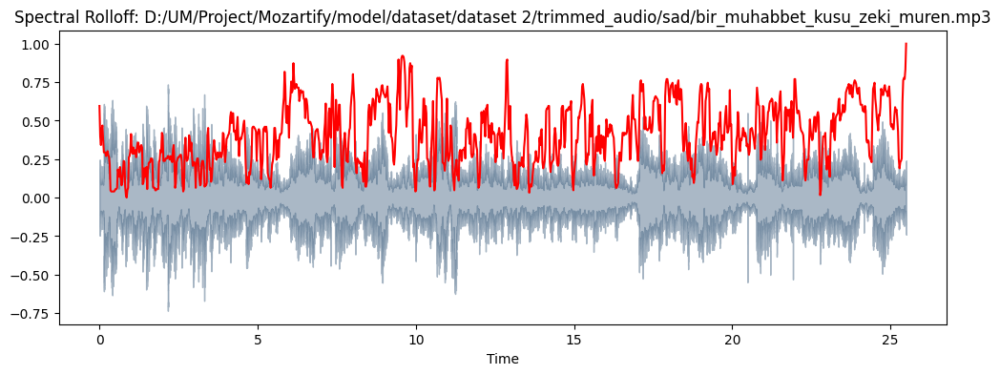

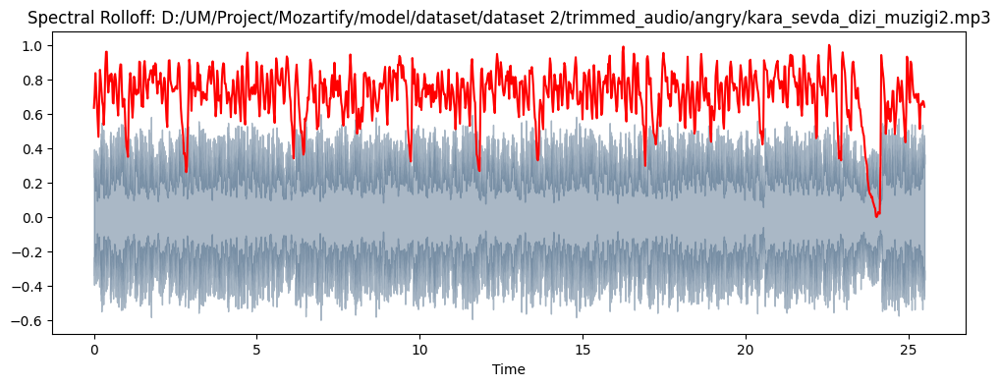

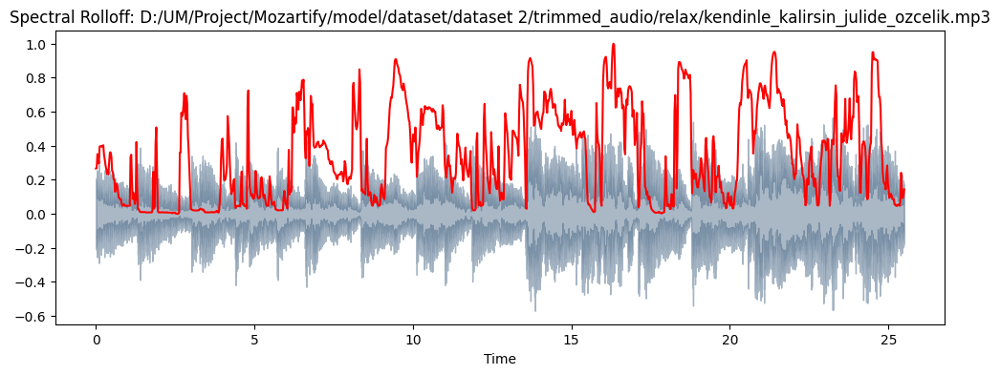

In [8]:
# Spectral Rolloff :frequency below which a specified percentage of the total spectral energy
for i in file:
    y,sr = librosa.load(i)
    rolloff = librosa.feature.spectral_rolloff(y=y+0.01, sr=sr)[0]
    frames = range(len(rolloff))
    t = librosa.frames_to_time(frames)
    
    plt.figure(figsize=(12,4))
    librosa.display.waveshow(y, sr=sr, alpha=0.4, color = "#2B4F72")
    plt.plot(t, normalize(rolloff), color='r')
    plt.title('Spectral Rolloff: '+i)

The number of zero-crossings: 60730


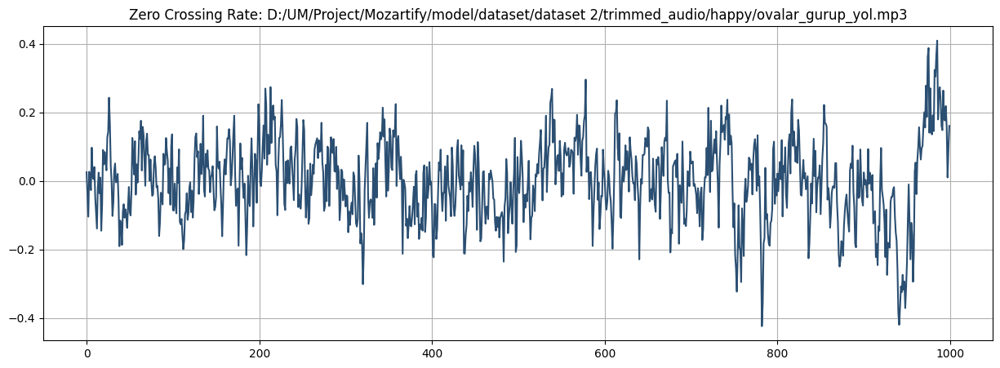

The number of zero-crossings: 80160


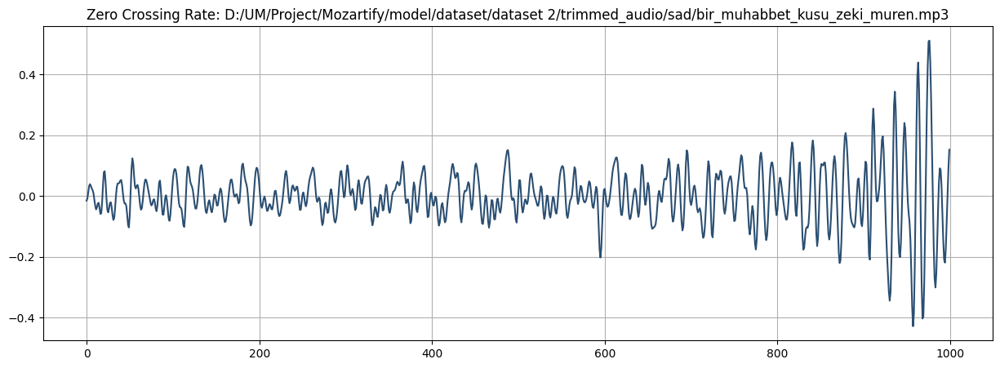

The number of zero-crossings: 70649


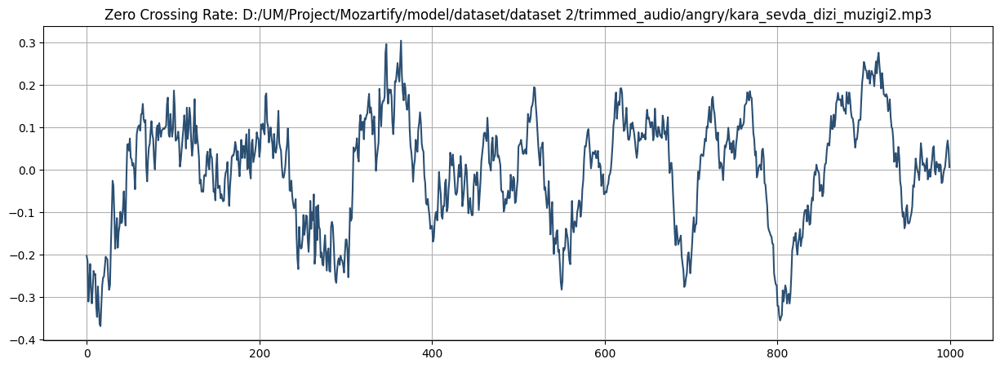

The number of zero-crossings: 26320


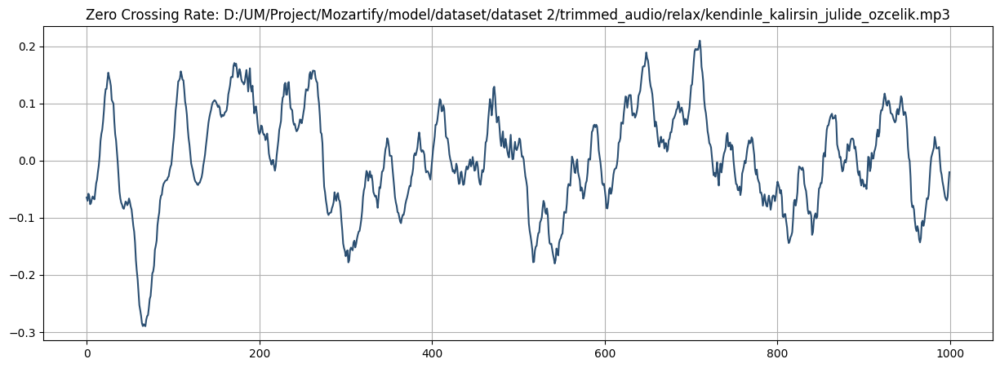

In [9]:
# Zero Crossing Rate
'''
A measure of the number of times in a given time interval/frame that 
the amplitude of the speech signals passes through a value of zero.                                 
Occurs if successive samples have different algebraic signs. 
The simple measure of the frequency content of a signal. 

'''
start = 2000
end = 3000
for i in file:
    y,sr = librosa.load(i)
    
    
    zc = librosa.zero_crossings(y)
    zcr= librosa.feature.zero_crossing_rate(y)[0]
    
    # count of zero crossings
    print("The number of zero-crossings:",sum(zc))
    
    plt.figure(figsize=(15,5))
    plt.plot(y[start:end],color="#2B4F72")
    plt.title('Zero Crossing Rate: '+i)
    plt.grid()
    plt.show()

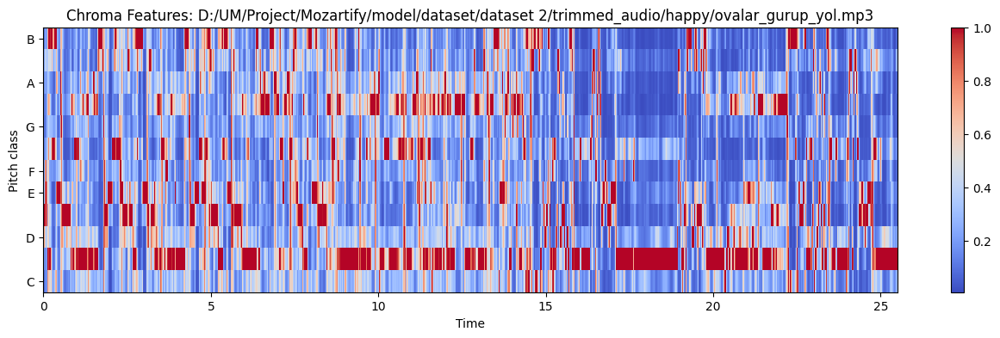

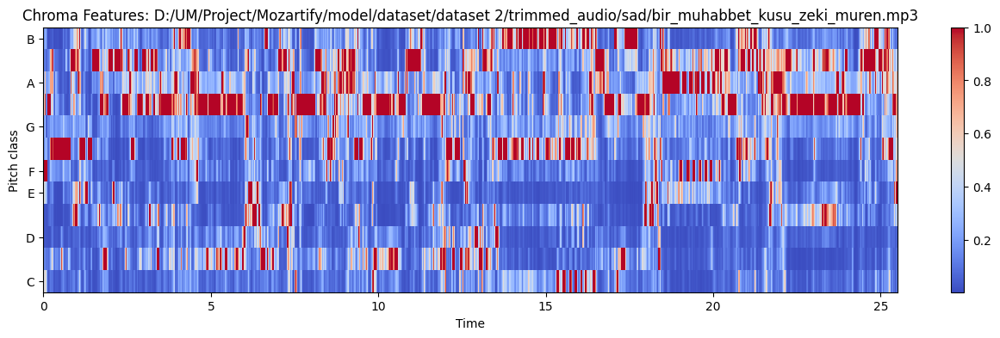

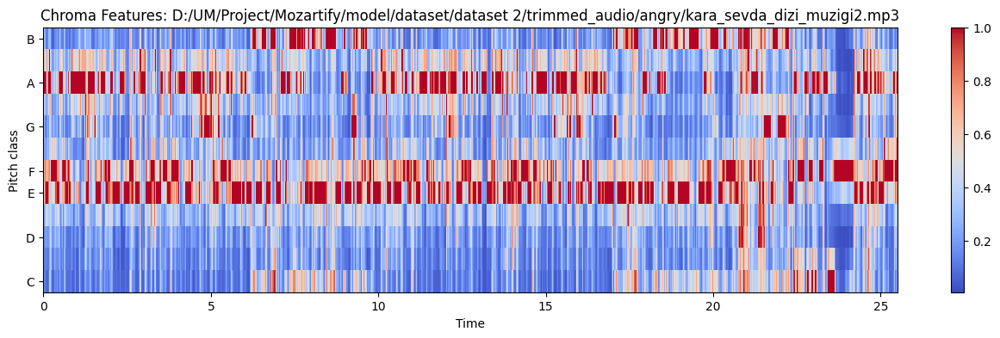

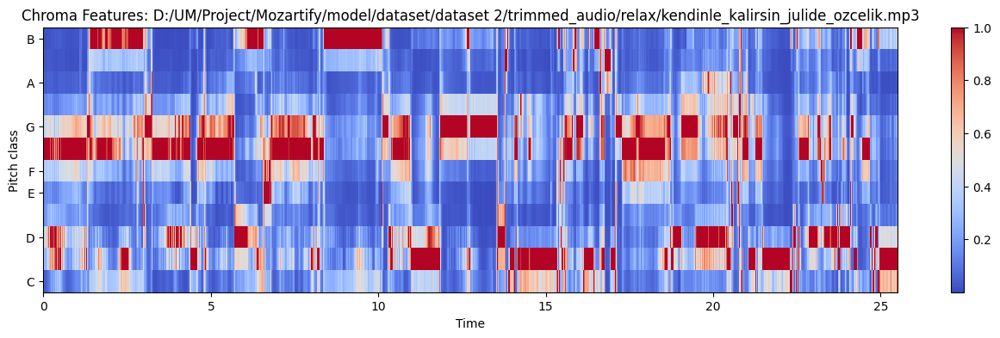

In [10]:
'''
Chroma Feature : analyzing music features whose pitches can be meaningfully categorized 
                 and whose tuning approximates to the equal-tempered scale. 
'''
for i in file:
    y,sr = librosa.load(i)
    chroma = librosa.feature.chroma_stft(y=y,sr=sr)
    plt.figure(figsize=(16,4))
    librosa.display.specshow(chroma, sr=sr,x_axis='time',y_axis='chroma',cmap='coolwarm')
    plt.colorbar()
    plt.title('Chroma Features: '+i)
    plt.show()

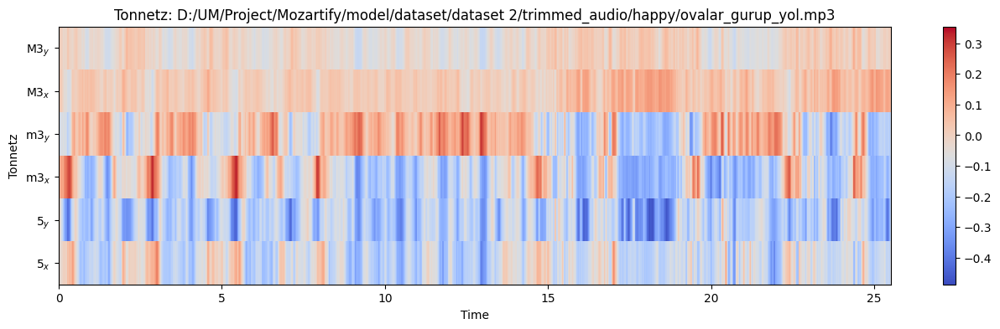

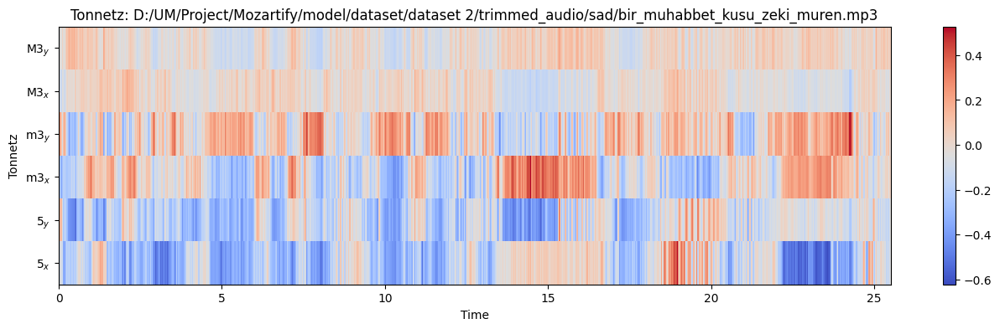

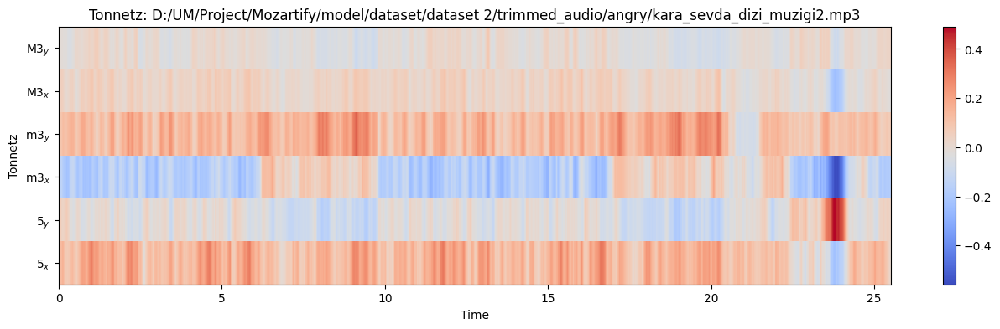

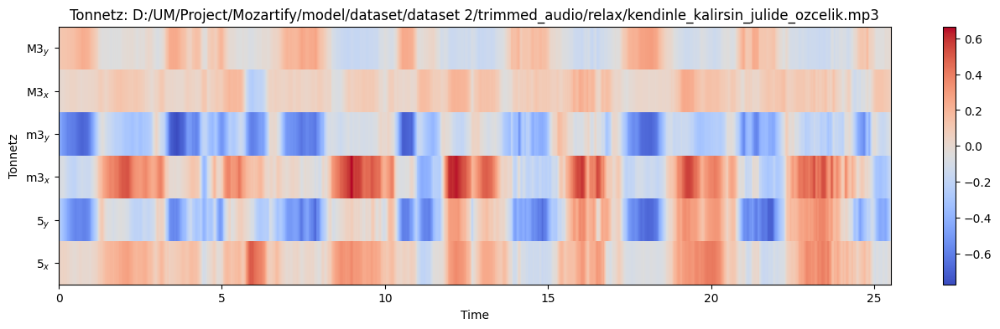

In [11]:
# Tonnetz
for i in file:
    x,sr = librosa.load(i)
    y = librosa.effects.harmonic(x)
    tonnetz = librosa.feature.tonnetz(y=y, sr=sr)
    plt.figure(figsize=(16,4))
    librosa.display.specshow(tonnetz, sr=sr,x_axis='time',y_axis='tonnetz',cmap='coolwarm')
    plt.colorbar()
    plt.title('Tonnetz: '+i)
    plt.show()

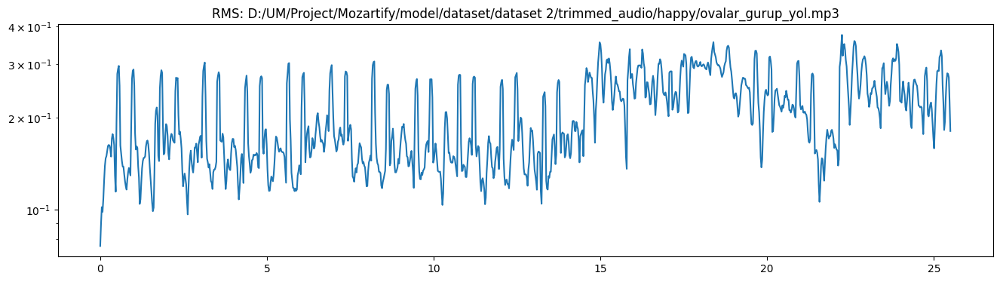

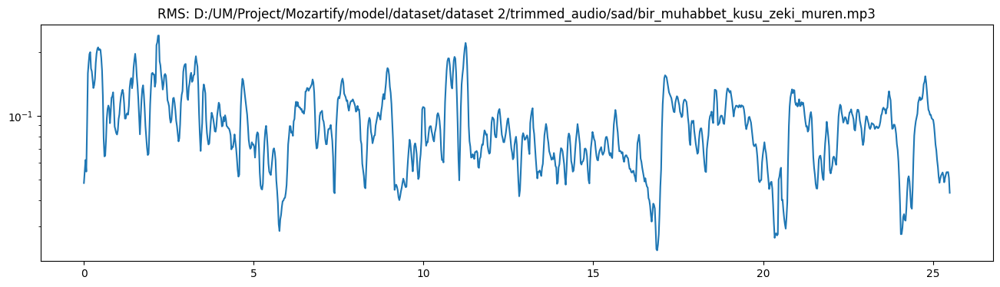

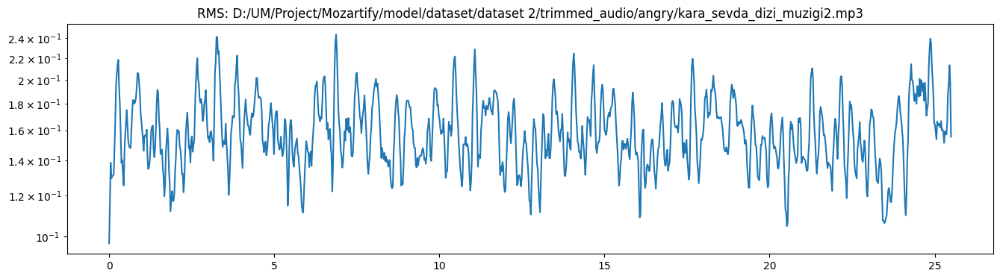

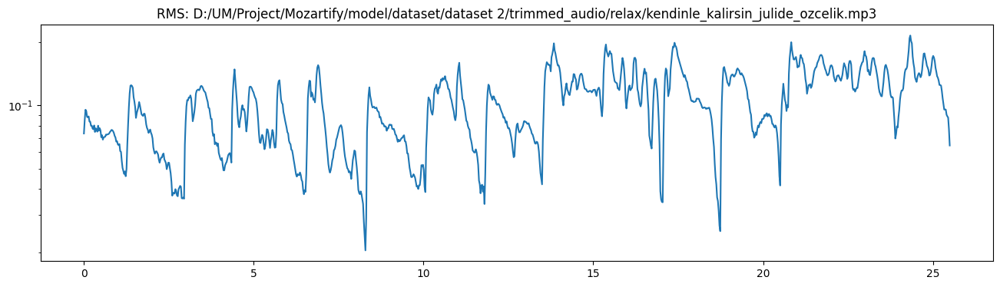

In [12]:
#RMS
for i in file:
    y,sr = librosa.load(i)
    rms = librosa.feature.rms(y=y)
    t = librosa.times_like(rms)
    plt.figure(figsize=(16, 4))
    plt.semilogy(t,rms[0])
    plt.title('RMS: '+i)
    plt.show()